In [1]:
# Import data manipulation package
import json, glob
import pandas as pd
import numpy as np

## Import data visualization packages

import seaborn as sns # Import seaborn
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import font_manager
%matplotlib inline
from collections import Counter

#Set Thai font
font_manager.fontManager.addfont('THSarabunChula-Regular.ttf')

In [2]:
# Aggregrate Scraping Data
data_list = []
for file_name in glob.iglob('raw-data/by_latlng/*.json', recursive=True):
    with open (file_name, "r") as f: data = json.loads(f.read())
    data_list+=data

for file_name in glob.iglob('raw-data/by_province_name/*.json', recursive=True):
    with open (file_name, "r") as f: data = json.loads(f.read())
    data_list+=data
    
df = pd.DataFrame(data_list)
df = df.drop_duplicates(subset=['id'], keep='first')
selected_province_list = ["กรุงเทพมหานคร", "สมุทรปราการ", "นนทบุรี", "ปทุมธานี", "นครปฐม", "สมุทรสาคร"]
df = df[df.province.isin(selected_province_list)]
df.to_csv("seven_data.csv", index=False)

In [25]:
file = "seven_data.csv"
df = pd.read_csv(file)
df.province.unique()
df.head()

,id,lat,lng,code,name,address,subdistrict,district,province,postcode,products,tel,distance,renovate,direction
0,16073,13.801410,100.183792,16073,แยกท่านา (นครชัยศรี),ต.บางกระเบา อ.นครชัยศรี นครปฐม,บางกระเบา,นครชัยศรี,นครปฐม,73120,"[{'id': 13, 'code': 'VF', 'name': 'ผักและผลไม้...",091-001-6073,1693.380123,False,https://www.google.com/maps/search/?api=1&quer...
1,15121,13.807352,100.160487,15121,ตลาดท่องเที่ยวศรีษะทอง(นครปฐม),ต.ศรีษะทอง อ.นครชัยศรี นครปฐม,ศรีษะทอง,นครชัยศรี,นครปฐม,73120,"[{'id': 6, 'code': 'AC', 'name': 'ออลล์คาเฟ่',...",091-001-5121,1734.692821,False,https://www.google.com/maps/search/?api=1&quer...
2,10840,13.801055,100.165850,10840,ปตท.ท่าตำหนัก,ต.บางแก้ว อ.นครชัยศรี นครปฐม,บางแก้ว,นครชัยศรี,นครปฐม,73120,"[{'id': 13, 'code': 'VF', 'name': 'ผักและผลไม้...",091-001-0840,1747.824889,False,https://www.google.com/maps/search/?api=1&quer...
3,14543,13.797550,100.174890,14543,ท่านา (นครชัยศรี),ต.ท่าตำหนัก อ.นครชัยศรี นครปฐม,ท่าตำหนัก,นครชัยศรี,นครปฐม,73120,"[{'id': 15, 'code': 'FM', 'name': 'เนื้อสัตว์แ...",091-001-4543,1831.236837,False,https://www.google.com/maps/search/?api=1&quer...
4,6288,13.898010,100.675338,6288,จตุโชติ 12,ถ.จตุโชติ แขวงออเงิน เขตสายไหม กรุงเทพมหานคร,ออเงิน,สายไหม,กรุงเทพมหานคร,10220,"[{'id': 15, 'code': 'FM', 'name': 'เนื้อสัตว์แ...",091-002-6288,424.474660,False,https://www.google.com/maps/search/?api=1&quer...


In [26]:
df.describe()

,id,lat,lng,code,postcode,distance
count,5420.000000,5420.000000,5420.000000,5420.000000,5420.000000,4079.000000
mean,8242.092620,13.779073,100.537343,8242.092620,16366.186531,1253.987964
std,4954.644781,0.121903,0.147245,4954.644781,18157.352957,472.661475
min,5.000000,13.456813,99.845263,5.000000,10010.000000,10.826156
25%,4033.750000,13.704064,100.475827,4033.750000,10220.000000,912.702515
50%,8247.500000,13.763050,100.547158,8247.500000,10400.000000,1308.744077
75%,12176.500000,13.852145,100.622689,12176.500000,11110.000000,1642.410288
max,16624.000000,14.174380,100.916030,16624.000000,77411.000000,1999.828321


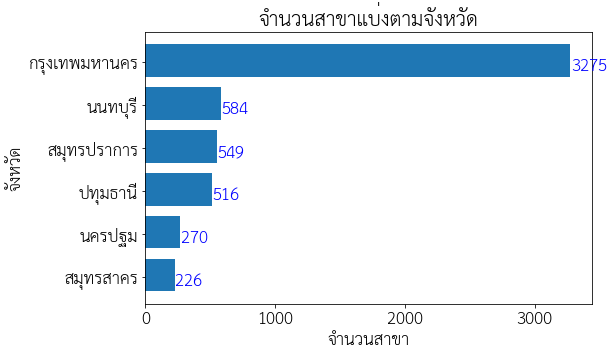

In [22]:
cnt_store_by_provice = df.groupby("province").count()['id'].reset_index().sort_values(by='id', ascending=False)
fig, ax = plt.subplots()
x = cnt_store_by_provice['province'].values
y = cnt_store_by_provice['id'].values
ind = np.arange(len(y))
width = 0.75 # the width of the bars 
ax.barh(ind, y, width)
ax.set_yticks(ind)
ax.set_yticklabels(x)
ax.set_yticks(ind+width/20)
ax.set_yticklabels(x, minor=False)
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('จำนวนสาขา')
ax.set_ylabel('จังหวัด')
ax.set_title('จำนวนสาขาแบ่งตามจังหวัด')
for i, v in enumerate(y):
    ax.text(v + 3, i + .25, str(v), color='blue', fontweight='bold')
font = {'family': 'TH Sarabun Chula', 'weight': 'bold', 'size': 25}
matplotlib.rc('font', **font)
matplotlib.rc('figure', figsize=(7,5))
plt.savefig('cnt_store_by_provice.png')
plt.show()

In [5]:
products =[]
for d in data_list:
    p = d['products']
    for item in p:
        item.update( {"store_id":d['id']})
    products+=p
products_x_store = pd.DataFrame(products)
products_x_store.head(2)

,id,code,name,image,logo,store_id
0,13,VF,ผักและผลไม้สด,/static/imgs/components/google-map/icons/vf.svg,/static/imgs/components/google-map/logos/vf.svg,16073
1,6,AC,ออลล์คาเฟ่,/static/imgs/components/google-map/icons/ic_7-...,/static/imgs/components/google-map/logos/ic_7-...,15121


In [34]:
products_x_store[['code','name']].drop_duplicates(subset=['code'], keep='first')

,code,name
0,VF,ผักและผลไม้สด
1,AC,ออลล์คาเฟ่
3,GP,กัฟ
4,FM,เนื้อสัตว์แช่แข็ง
9,SP,สเลอปี้
10,KS,คัดสรร
90,XT,เอ็กซ์ต้า พลัส
269,FP,ฟู้ดเพลส


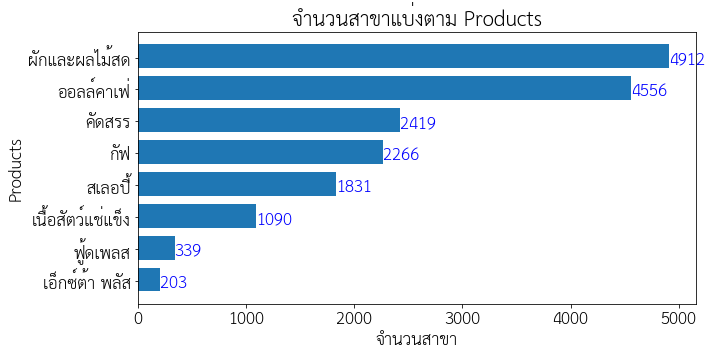

In [6]:
cnt_store_product = products_x_store.groupby("name").agg({"store_id": "nunique"}).reset_index().sort_values(by='store_id', ascending=False)
fig, ax = plt.subplots()
y = cnt_store_product['store_id'].values
x =cnt_store_product['name'].values
ind = np.arange(len(y))
width = 0.75 # the width of the bars 
ax.barh(ind, y, width)
ax.set_yticks(ind)
ax.set_yticklabels(x)
ax.set_yticks(ind+width/20)
ax.set_yticklabels(x, minor=False)
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('จำนวนสาขา')
ax.set_ylabel('Products')
ax.set_title('จำนวนสาขาแบ่งตาม Products')
for i, v in enumerate(y):
    ax.text(v, i + .25, str(v), color='blue', fontweight='bold')
font = {'family': 'TH Sarabun Chula', 'weight': 'bold', 'size': 25}
matplotlib.rc('font', **font)
matplotlib.rc('figure', figsize=(12,6))
plt.savefig('cnt_store_product.png')
plt.show()

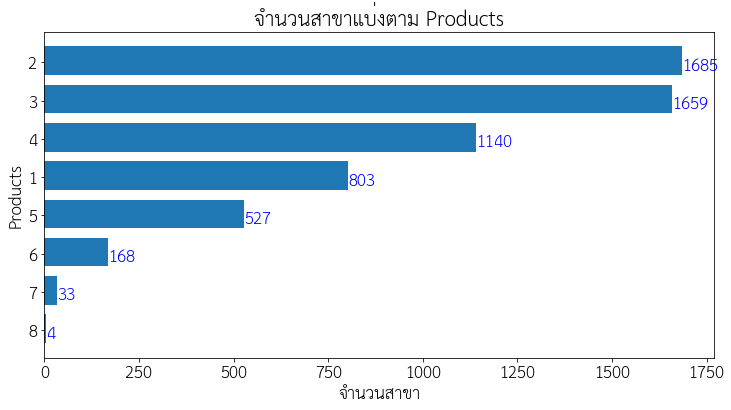

In [7]:
products_per_store = products_x_store.groupby("store_id").agg({"id": "nunique"}).reset_index()
cnt_products_per_store = products_per_store.groupby("id").count().reset_index().sort_values(by='store_id', ascending=False)
cnt_products_per_store.columns =['num_products', 'cnt_store']
fig, ax = plt.subplots()
y = cnt_products_per_store['cnt_store'].values
x =cnt_products_per_store['num_products'].values
ind = np.arange(len(y))
width = 0.75 # the width of the bars 
ax.barh(ind, y, width)
ax.set_yticks(ind)
ax.set_yticklabels(x)
ax.set_yticks(ind+width/20)
ax.set_yticklabels(x, minor=False)
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('จำนวนสาขา')
ax.set_ylabel('Products')
ax.set_title('จำนวนสาขาแบ่งตาม Products')
for i, v in enumerate(y):
    ax.text(v+.25, i + .25, str(v), color='blue', fontweight='bold')
plt.savefig('cnt_store_product.png')
plt.show()

In [8]:
df_store_x_products = products_x_store.pivot_table(index=["store_id"], 
                    columns='name', 
                    values='id').fillna(False).replace(products_x_store.id.unique(), True)
df_store_x_products.head()

name,กัฟ,คัดสรร,ผักและผลไม้สด,ฟู้ดเพลส,สเลอปี้,ออลล์คาเฟ่,เนื้อสัตว์แช่แข็ง,เอ็กซ์ต้า พลัส
store_id,,,,,,,,
00005,True,False,False,False,True,True,False,False
00006,True,False,False,False,True,False,False,False
00007,True,False,False,False,True,True,False,False
00010,True,True,True,False,True,True,False,False
00012,True,True,True,False,True,True,False,False


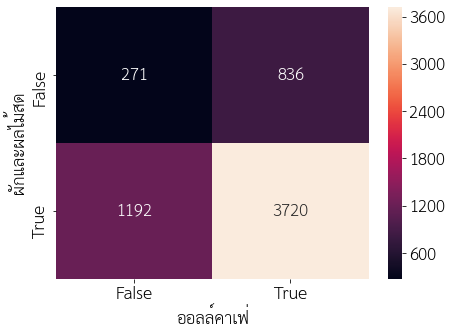

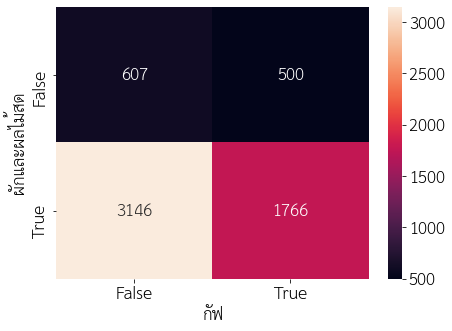

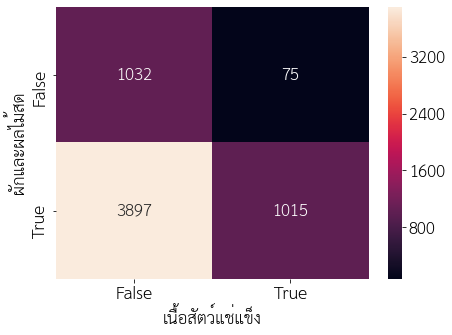

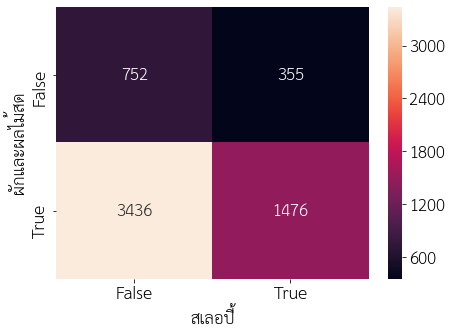

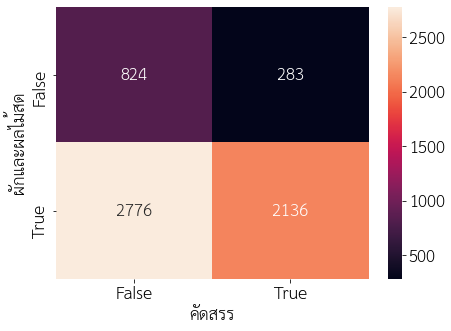

...

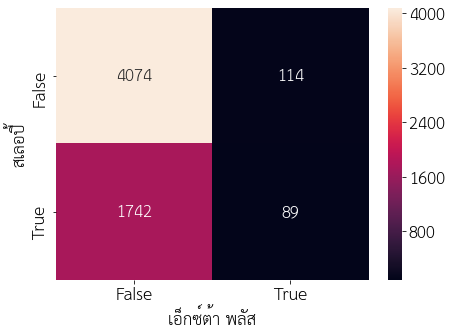

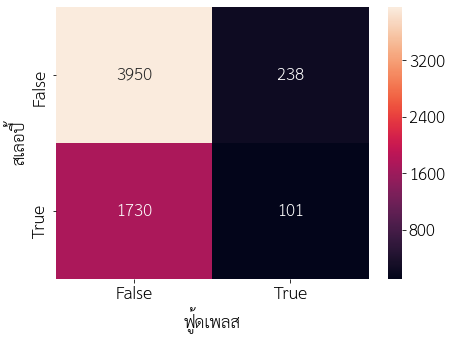

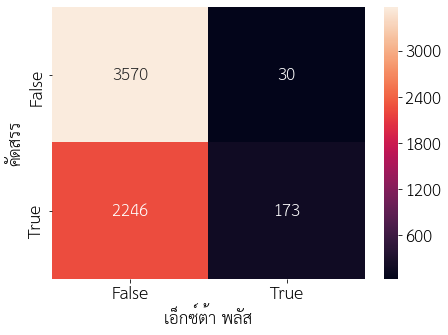

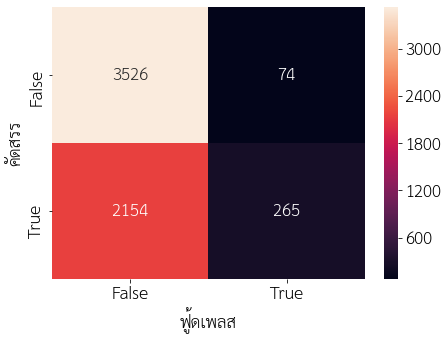

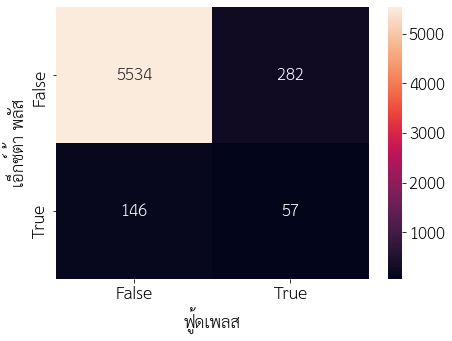

In [9]:
from itertools import combinations
products_list = products_x_store.name.unique()
combi = list(combinations(products_list, 2))
crosstab_list = []
for comb in combi:
    ct = pd.crosstab(index=df_store_x_products[comb[0]],columns=df_store_x_products[comb[1]])
    crosstab_list.append({
        "combination": f"{comb[0]}_{comb[1]}",
        "count":ct[1][1]
    })
    matplotlib.rc('figure', figsize=(7,5))
    sns.heatmap(ct, annot = True, fmt="d")
    plt.savefig(f'cnt_products_combination_{comb[0]}_{comb[1]}.png')
    plt.show()

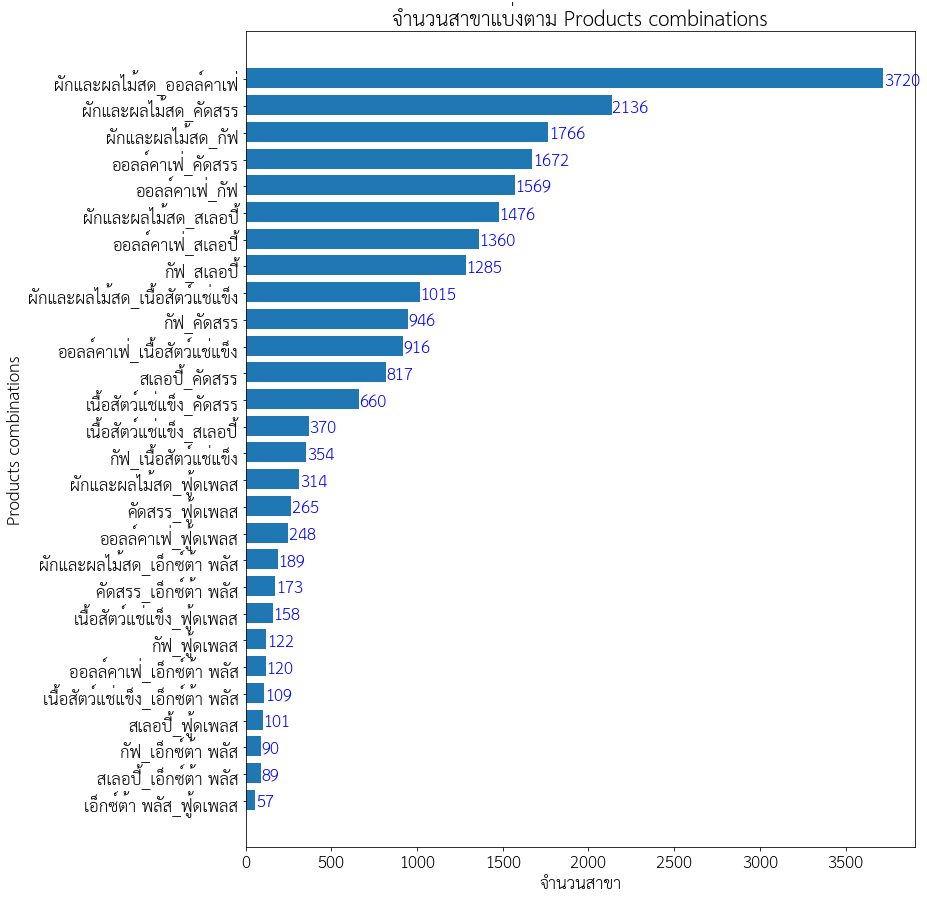

In [19]:
df_products_combination = pd.DataFrame(crosstab_list).sort_values(by='count', ascending=False)
fig, ax = plt.subplots()
matplotlib.rc('figure', figsize=(15,10))
y = df_products_combination['count'].values
x = df_products_combination['combination'].values
ind = np.arange(len(y))
width = 0.75 # the width of the bars 
ax.barh(ind, y, width)
ax.set_yticks(ind)
ax.set_yticklabels(x)
ax.set_yticks(ind+width/20)
ax.set_yticklabels(x, minor=False)
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('จำนวนสาขา')
ax.set_ylabel('Products combinations')
ax.set_title('จำนวนสาขาแบ่งตาม Products combinations')
for i, v in enumerate(y):
    ax.text(v + 3, i + .25, str(v), color='blue', fontweight='bold')
matplotlib.rc('figure', figsize=(12,15))
plt.savefig('cnt_store_product.png')
plt.show()

In [11]:
import folium

In [12]:
thai_geojson = "bangkok_and_main_geo.json"
map = folium.Map(location=[13.752902,100.496298],zoom_start=9)
x = cnt_store_by_provice['province'].values
y = cnt_store_by_provice['id'].values
folium.Choropleth(
    geo_data=thai_geojson,
    name="choropleth",
    data=cnt_store_by_provice,
    columns=["province", "id"],
    key_on="feature.id",
    fill_color="BuPu",
    fill_opacity=0.9,
    line_opacity=0.2,
    legend_name="จำนวนร้านค้า 7-11",
).add_to(map)
map

In [37]:
#create map
map = folium.Map(location=[13.7278956,100.52412349999997],zoom_start=10)
fg = folium.FeatureGroup(name='7-11 Store Map')

#create marker on the map by lat & lng
for i in range(df.shape[0]):
    lat = df.loc[i,'lat']
    long = df.loc[i,'lng']
    popup = df.loc[i,'name']
    fg.add_child(folium.CircleMarker(location=[lat,long], popup = popup
                                  ,radius = 2, fill=True, color='green'))
map.add_child(fg)
map.save('7eleven_Map.html')
mapimport numpy as np
import matplotlib.pyplot as plt

browser_market_share = {
    'browsers': ['firefox', 'chrome', 'safari', 'edge', 'ie', 'opera'],
    'market_share': [8.61, 69.55, 8.36, 4.12, 2.76, 2.43],
    'color': ['#5A69AF', '#579E65', '#F9C784', '#FC944A', '#F24C00', '#00B825']
}


class BubbleChart:
    def __init__(self, area, bubble_spacing=0):
        """
        Setup for bubble collapse.

        Parameters
        ----------
        area : array-like
            Area of the bubbles.
        bubble_spacing : float, default: 0
            Minimal spacing between bubbles after collapsing.

        Notes
        -----
        If "area" is sorted, the results might look weird.
        """
        area = np.asarray(area)
        r = np.sqrt(area / np.pi)

        self.bubble_spacing = bubble_spacing
        self.bubbles = np.ones((len(area), 4))
        self.bubbles[:, 2] = r
        self.bubbles[:, 3] = area
        self.maxstep = 2 * self.bubbles[:, 2].max() + self.bubble_spacing
        self.step_dist = self.maxstep / 2

        # calculate initial grid layout for bubbles
        length = np.ceil(np.sqrt(len(self.bubbles)))
        grid = np.arange(length) * self.maxstep
        gx, gy = np.meshgrid(grid, grid)
        self.bubbles[:, 0] = gx.flatten()[:len(self.bubbles)]
        self.bubbles[:, 1] = gy.flatten()[:len(self.bubbles)]

        self.com = self.center_of_mass()

    def center_of_mass(self):
        return np.average(
            self.bubbles[:, :2], axis=0, weights=self.bubbles[:, 3]
        )

    def center_distance(self, bubble, bubbles):
        return np.hypot(bubble[0] - bubbles[:, 0],
                        bubble[1] - bubbles[:, 1])

    def outline_distance(self, bubble, bubbles):
        center_distance = self.center_distance(bubble, bubbles)
        return center_distance - bubble[2] - \
            bubbles[:, 2] - self.bubble_spacing

    def check_collisions(self, bubble, bubbles):
        distance = self.outline_distance(bubble, bubbles)
        return len(distance[distance < 0])

    def collides_with(self, bubble, bubbles):
        distance = self.outline_distance(bubble, bubbles)
        idx_min = np.argmin(distance)
        return idx_min if type(idx_min) == np.ndarray else [idx_min]

    def collapse(self, n_iterations=50):
        """
        Move bubbles to the center of mass.

        Parameters
        ----------
        n_iterations : int, default: 50
            Number of moves to perform.
        """
        for _i in range(n_iterations):
            moves = 0
            for i in range(len(self.bubbles)):
                rest_bub = np.delete(self.bubbles, i, 0)
                # try to move directly towards the center of mass
                # direction vector from bubble to the center of mass
                dir_vec = self.com - self.bubbles[i, :2]

                # shorten direction vector to have length of 1
                dir_vec = dir_vec / np.sqrt(dir_vec.dot(dir_vec))

                # calculate new bubble position
                new_point = self.bubbles[i, :2] + dir_vec * self.step_dist
                new_bubble = np.append(new_point, self.bubbles[i, 2:4])

                # check whether new bubble collides with other bubbles
                if not self.check_collisions(new_bubble, rest_bub):
                    self.bubbles[i, :] = new_bubble
                    self.com = self.center_of_mass()
                    moves += 1
                else:
                    # try to move around a bubble that you collide with
                    # find colliding bubble
                    for colliding in self.collides_with(new_bubble, rest_bub):
                        # calculate direction vector
                        dir_vec = rest_bub[colliding, :2] - self.bubbles[i, :2]
                        dir_vec = dir_vec / np.sqrt(dir_vec.dot(dir_vec))
                        # calculate orthogonal vector
                        orth = np.array([dir_vec[1], -dir_vec[0]])
                        # test which direction to go
                        new_point1 = (self.bubbles[i, :2] + orth *
                                      self.step_dist)
                        new_point2 = (self.bubbles[i, :2] - orth *
                                      self.step_dist)
                        dist1 = self.center_distance(
                            self.com, np.array([new_point1]))
                        dist2 = self.center_distance(
                            self.com, np.array([new_point2]))
                        new_point = new_point1 if dist1 < dist2 else new_point2
                        new_bubble = np.append(new_point, self.bubbles[i, 2:4])
                        if not self.check_collisions(new_bubble, rest_bub):
                            self.bubbles[i, :] = new_bubble
                            self.com = self.center_of_mass()

            if moves / len(self.bubbles) < 0.1:
                self.step_dist = self.step_dist / 2

    def plot(self, ax, labels, colors):
        """
        Draw the bubble plot.

        Parameters
        ----------
        ax : matplotlib.axes.Axes
        labels : list
            Labels of the bubbles.
        colors : list
            Colors of the bubbles.
        """
        for i in range(len(self.bubbles)):
            circ = plt.Circle(
                self.bubbles[i, :2], self.bubbles[i, 2], color=colors[i])
            ax.add_patch(circ)
            ax.text(*self.bubbles[i, :2], labels[i],
                    horizontalalignment='center', verticalalignment='center')


bubble_chart = BubbleChart(area=browser_market_share['market_share'],
                           bubble_spacing=0.1)

bubble_chart.collapse()

fig, ax = plt.subplots(subplot_kw=dict(aspect="equal"))
bubble_chart.plot(
    ax, browser_market_share['browsers'], browser_market_share['color'])
ax.axis("off")
ax.relim()
ax.autoscale_view()
ax.set_title('Browser market share')

plt.show()

In [14]:
df.shape[0]

5420

In [15]:
with open ('lotus_data.json', "r") as f: lotus_data = json.loads(f.read())

In [16]:
lotus_data['store'][0]

{'store_id': '1101',
 'store_title': 'เทสโก้ โลตัส รามอินทรา',
 'store_types': '10',
 'latitude': '13.845254',
 'longitude': '100.650887',
 'distance': 0,
 'info': {'open': '0:00',
  'close': '23:59',
  'tel': '0626057449',
  'phone': None},
 'upload_date': None}

In [35]:
map = folium.Map(location=[13.7278956,100.52412349999997],zoom_start=10)
fg = folium.FeatureGroup(name='Lotus Store Map')

#create marker on the map by lat & lng
for i in range(len(lotus_data['store'])):
    lat = lotus_data['store'][i]['latitude']
    long = lotus_data['store'][i]['longitude']
    popup = lotus_data['store'][i]['store_title']
    fg.add_child(folium.CircleMarker(location=[lat,long], popup = popup
                                  ,radius = 2, fill=True, color='blue'))
map.add_child(fg)
map.save('Lotus_Map.html')
map

In [128]:
# Import Class for Create Buble Chart 
class BubbleChart:
    def __init__(self, area, bubble_spacing=0):
        """
        Setup for bubble collapse.

        Parameters
        ----------
        area : array-like
            Area of the bubbles.
        bubble_spacing : float, default: 0
            Minimal spacing between bubbles after collapsing.

        Notes
        -----
        If "area" is sorted, the results might look weird.
        """
        area = np.asarray(area)
        r = np.sqrt(area / np.pi)

        self.bubble_spacing = bubble_spacing
        self.bubbles = np.ones((len(area), 4))
        self.bubbles[:, 2] = r
        self.bubbles[:, 3] = area
        self.maxstep = 2 * self.bubbles[:, 2].max() + self.bubble_spacing
        self.step_dist = self.maxstep / 2

        # calculate initial grid layout for bubbles
        length = np.ceil(np.sqrt(len(self.bubbles)))
        grid = np.arange(length) * self.maxstep
        gx, gy = np.meshgrid(grid, grid)
        self.bubbles[:, 0] = gx.flatten()[:len(self.bubbles)]
        self.bubbles[:, 1] = gy.flatten()[:len(self.bubbles)]

        self.com = self.center_of_mass()

    def center_of_mass(self):
        return np.average(
            self.bubbles[:, :2], axis=0, weights=self.bubbles[:, 3]
        )

    def center_distance(self, bubble, bubbles):
        return np.hypot(bubble[0] - bubbles[:, 0],
                        bubble[1] - bubbles[:, 1])

    def outline_distance(self, bubble, bubbles):
        center_distance = self.center_distance(bubble, bubbles)
        return center_distance - bubble[2] - \
            bubbles[:, 2] - self.bubble_spacing

    def check_collisions(self, bubble, bubbles):
        distance = self.outline_distance(bubble, bubbles)
        return len(distance[distance < 0])

    def collides_with(self, bubble, bubbles):
        distance = self.outline_distance(bubble, bubbles)
        idx_min = np.argmin(distance)
        return idx_min if type(idx_min) == np.ndarray else [idx_min]

    def collapse(self, n_iterations=50):
        """
        Move bubbles to the center of mass.

        Parameters
        ----------
        n_iterations : int, default: 50
            Number of moves to perform.
        """
        for _i in range(n_iterations):
            moves = 0
            for i in range(len(self.bubbles)):
                rest_bub = np.delete(self.bubbles, i, 0)
                # try to move directly towards the center of mass
                # direction vector from bubble to the center of mass
                dir_vec = self.com - self.bubbles[i, :2]

                # shorten direction vector to have length of 1
                dir_vec = dir_vec / np.sqrt(dir_vec.dot(dir_vec))

                # calculate new bubble position
                new_point = self.bubbles[i, :2] + dir_vec * self.step_dist
                new_bubble = np.append(new_point, self.bubbles[i, 2:4])

                # check whether new bubble collides with other bubbles
                if not self.check_collisions(new_bubble, rest_bub):
                    self.bubbles[i, :] = new_bubble
                    self.com = self.center_of_mass()
                    moves += 1
                else:
                    # try to move around a bubble that you collide with
                    # find colliding bubble
                    for colliding in self.collides_with(new_bubble, rest_bub):
                        # calculate direction vector
                        dir_vec = rest_bub[colliding, :2] - self.bubbles[i, :2]
                        dir_vec = dir_vec / np.sqrt(dir_vec.dot(dir_vec))
                        # calculate orthogonal vector
                        orth = np.array([dir_vec[1], -dir_vec[0]])
                        # test which direction to go
                        new_point1 = (self.bubbles[i, :2] + orth *
                                      self.step_dist)
                        new_point2 = (self.bubbles[i, :2] - orth *
                                      self.step_dist)
                        dist1 = self.center_distance(
                            self.com, np.array([new_point1]))
                        dist2 = self.center_distance(
                            self.com, np.array([new_point2]))
                        new_point = new_point1 if dist1 < dist2 else new_point2
                        new_bubble = np.append(new_point, self.bubbles[i, 2:4])
                        if not self.check_collisions(new_bubble, rest_bub):
                            self.bubbles[i, :] = new_bubble
                            self.com = self.center_of_mass()

            if moves / len(self.bubbles) < 0.1:
                self.step_dist = self.step_dist / 2

    def plot(self, ax, labels, colors):
        """
        Draw the bubble plot.

        Parameters
        ----------
        ax : matplotlib.axes.Axes
        labels : list
            Labels of the bubbles.
        colors : list
            Colors of the bubbles.
        """
        for i in range(len(self.bubbles)):
            circ = plt.Circle(
                self.bubbles[i, :2], self.bubbles[i, 2], color=colors[i])
            ax.add_patch(circ)
            ax.text(*self.bubbles[i, :2], labels[i],
                    horizontalalignment='center', verticalalignment='center')



In [129]:
from pythainlp.tokenize import word_tokenize

In [130]:
text = "โอเคบ่พวกเรารักภาษาบ้านเกิด"
word_tokenize(text, engine="newmm")

['โอเค', 'บ่', 'พวกเรา', 'รัก', 'ภาษา', 'บ้านเกิด']

In [131]:
all_tokens = []
for shop_name in df.name.values:
    tokens = word_tokenize(shop_name.replace(" ",""), engine="newmm")
    all_tokens += tokens
token_cnt = dict(Counter(z))

In [132]:
df_dict = []
for item in token_cnt.items():
    print(item)
    if len(item[0])>1:
        df_dict.append({
            "token":item[0],
            "count":item[1]
        })

('แยก', 173)
('ท่า', 43)
('นา', 14)
('(', 840)
('นครชัยศรี', 11)
(')', 862)
('ตลาด', 233)
('ท่องเที่ยว', 1)
('ศรีษะ', 1)
('ทอง', 138)
('นครปฐม', 27)
('ปตท.', 208)
('ตำหนัก', 3)
('จตุ', 5)
('โชติ', 5)
('12', 41)
('17', 47)
('ออ', 4)
('เงิน', 8)
('เคหะ', 74)
('จุด', 514)
('2', 722)
('สุขาภิบาล', 17)
('5', 139)
('ซ.', 160)
('57', 17)
('ซอย', 477)
('39', 36)
('เพิ่ม', 13)
('สิน', 47)
('64', 20)
('42', 27)
('32', 20)
('10', 60)
('20', 50)
('พหลโยธิน', 74)
('54', 18)
('/', 140)
('1', 258)
('4', 193)
('จรัญฯ', 36)
('45', 14)
('จรัญสนิทวงศ์', 24)
('14', 48)
('34', 30)
('35', 25)
('โบว์', 1)
('41', 20)
('เจริญ', 101)
('สุข', 123)
('LPN', 48)
('สวีท', 2)
('ปิ่น', 36)
('เกล้า', 28)
('บรม', 16)
('ราช', 44)
('ชนนี', 16)
('49', 12)
('เทพ', 28)
('นครินทร์', 2)
('Booth', 65)
('พลาซ่า', 35)
('40', 28)
('3', 321)
('พาต้า', 1)
('พันธ์', 9)
('ศักดิ์', 4)
('วิลล่า', 25)
('บางขุนนนท์', 5)
('สน.', 9)
('-', 337)
('เพลส', 24)
('อรุณ', 8)
('อัม', 9)
('ริน', 24)
('ทร', 22)
('์', 70)
('37', 20)
('53', 16)
('ThePa

('นฤ', 2)
('APCondo', 1)
('TheNichePride', 1)
('เกษมราษฎร์', 2)
('ปูนซีเมนต์', 1)
('ก้อง', 1)
('ตูม', 5)
('อิม', 1)
('บางโฉลง', 5)
('คอนเนค', 1)
('จำเริญ', 1)
('กันตนา', 3)
('นค', 1)
('์เลค&', 1)
('ปาริชาต', 1)
('สุเรนทร์', 13)
('สุเหร่า', 5)
('คลองหนึ่ง', 4)
('กะโหลก', 1)
('Thecompound', 1)
('บ้่านคณา', 1)
('คาม', 2)
('เชือก', 1)
('หนัง', 1)
('นิศาชล', 1)
('เนติบัณฑิต', 1)
('ย', 1)
('สภา', 1)
('ส์', 1)
('สัตว์', 1)
('คลินิก', 1)
('ALINK', 1)
('PSTheTree', 1)
('อารมณ์', 1)
('ThePlant', 2)
('ปัญจะ', 1)
('นิมมาน', 1)
('เสน่หา', 1)
('ชบบท', 1)
('เกรียงไกร', 1)
('DHL', 1)
('ชนบท', 4)
('ผู้โดยสาร', 1)
('AirportLink', 1)
('จอด', 2)
('คลองสาม', 4)
('เจ๊', 1)
('มล', 1)
('พูด', 1)
('ตลาดเสรี', 2)
('พร้าว', 2)
('เสถียร', 2)
('งูเหลือม', 2)
('จอก', 10)
('บึง', 8)
('พร้อย', 2)
('ธัญบุรี', 1)
('ชัชวาล', 1)
('มอเตอร์เวย์', 4)
('CITYHOME', 1)
('กรีน', 5)
('มวลชน', 1)
('กล้วยไม้', 1)
('ทศ', 1)
('กัณฑ์', 1)
('พลอย', 2)
('อัสสัมชัญ', 1)
('โฟม', 1)
('แพลน', 1)
('ท์(', 1)
('PropertyPerfectPark', 2)
('นันท

In [133]:
shop_name_token = pd.DataFrame(df_dict)

In [134]:
shop_name_token = shop_name_token.sort_values(by='count', ascending=False)

In [135]:
shop_name_token_subset = shop_name_token[shop_name_token['count']>=40]
shop_name_token_subset = shop_name_token_subset[~shop_name_token_subset.isin([
    'สุขุมวิท','ทอง','พระราม','สุข','ประชา','เจริญ','ลาดพร้าว','เลียบ','ไทย','22','ริ','ทรัพย์',
    '12','15','ท่า','น้อย','ธานี','ราช','เพชรเกษม','11','10','พหลโยธิน','รามคำแหง',
    'กลาง','บางนา','ราษฎร์','อ่อนนุช','พัฒนา',
    'เมือง','ชัย','เคหะ','สาย','นคร','ลำ','ศรี','บ้าน','พฤกษา','ลูก','Booth','พระ','แก้ว','สวัสดิ์','เอก','อุทิศ',
    'แจ้ง','ใหม่','วิลล์','หลวง','วัฒนะ','LPN','รามอินทรา','มิตร','สิน','13','14','15','20',
    'รังสิต','กา','22','ริ','17'])]
shop_name_token_subset = shop_name_token_subset.dropna()
shop_name_token_subset['color']='#579E65'

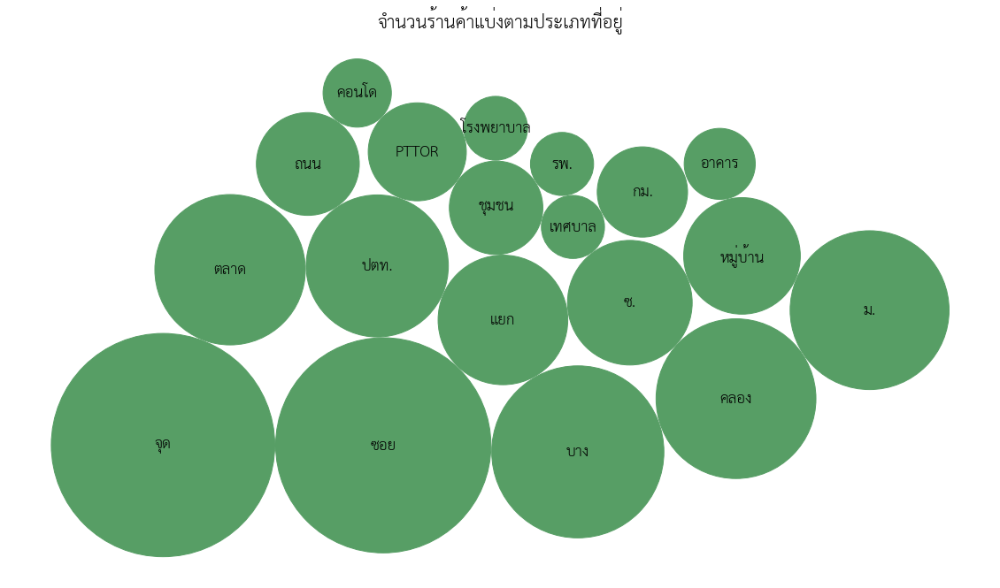

In [136]:
bubble_chart = BubbleChart(area=shop_name_token_subset['count'].values,
                           bubble_spacing=0.1)

bubble_chart.collapse()

fig, ax = plt.subplots(subplot_kw=dict(aspect="equal"))
bubble_chart.plot(
    ax, shop_name_token_subset['token'].values, shop_name_token_subset['color'].values)
ax.axis("off")
ax.relim()
ax.autoscale_view()
ax.set_title('จำนวนร้านค้าแบ่งตามประเภทที่อยู่')
matplotlib.rc('font', **font)
matplotlib.rc('figure', figsize=(20,19))
plt.show()